In [1]:
import sys

sys.path.insert(0, '../lucid')

import lucid_video as L
import common as C
import tensorflow as tf

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
model = L.I3D()
model.load_graphdef()

In [3]:
model.show_graph()

# Low res parametrizations

In [62]:
def mk_param(fs=[8, 16, 16, 32], img_size = 224, frames = 79):
    def interpolate_f():
        
        unique = L.fft_video((1, frames, img_size, img_size, 3))
        shared = [
            lowres.lowres_tensor((1, frames, img_size, img_size, 3), (1, frames//fs[0], img_size//2, img_size//2, 3)),
            lowres.lowres_tensor((1, frames, img_size, img_size, 3), (1, frames//fs[1], img_size//4, img_size//4, 3)),
            lowres.lowres_tensor((1, frames, img_size, img_size, 3), (1, frames//fs[2], img_size//8, img_size//8, 3)),
            lowres.lowres_tensor((1, frames, img_size, img_size, 3), (1, frames//fs[3], img_size//16, img_size//16, 3)),
        ]
        return color.to_valid_rgb(unique + sum(shared), decorrelate=True)
    return interpolate_f

In [60]:
from lucid.optvis.param import spatial, color, lowres


param = interpolate_f
layer = 'inceptioni3d/Mixed_5b/concat'
obj = L.neuron(layer, 120)#  + 1e-1 * L.alignment(layer, 79)

# obj = L.channel('inceptioni3d/Mixed_5b/concat', 120)
# obj = "inceptioni3d/Mixed_5b/concat:120"


# thresholds=list(range(10, 150, 15))
transforms=L.standard_transforms


images = L.render_vis(model, obj, thresholds=[150],
                        param_f=mk_param([8, 16, 16, 16]), transforms=L.standard_transforms)
C.save_vid(images[-1], name='shared-image-aligment', frames='-'.join(map(str, fs)))

InvalidArgumentError: slice index 78 of dimension 1 out of bounds.
	 [[node strided_slice_631 (defined at /home/arseni/c3d/public/lucid_video.py:143) ]]
	 [[node gradients/map_1/while/map/while/TensorArrayWrite/TensorArrayWriteV3_grad/TensorArrayReadV3/StackPopV2 (defined at ../lucid/lucid/optvis/render.py:182) ]]

Caused by op 'strided_slice_631', defined at:
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/kernelapp.py", line 505, in start
    self.io_loop.start()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/platform/asyncio.py", line 148, in start
    self.asyncio_loop.run_forever()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/asyncio/base_events.py", line 539, in run_forever
    self._run_once()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/asyncio/base_events.py", line 1775, in _run_once
    handle._run()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/ioloop.py", line 690, in <lambda>
    lambda f: self._run_callback(functools.partial(callback, future))
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/ioloop.py", line 743, in _run_callback
    ret = callback()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/gen.py", line 781, in inner
    self.run()
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/gen.py", line 742, in run
    yielded = self.gen.send(value)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 357, in process_one
    yield gen.maybe_future(dispatch(*args))
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/gen.py", line 209, in wrapper
    yielded = next(result)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 267, in dispatch_shell
    yield gen.maybe_future(handler(stream, idents, msg))
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/gen.py", line 209, in wrapper
    yielded = next(result)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 534, in execute_request
    user_expressions, allow_stdin,
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tornado/gen.py", line 209, in wrapper
    yielded = next(result)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/ipkernel.py", line 294, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/ipykernel/zmqshell.py", line 536, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2848, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2874, in _run_cell
    return runner(coro)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/async_helpers.py", line 67, in _pseudo_sync_runner
    coro.send(None)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3049, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3214, in run_ast_nodes
    if (yield from self.run_code(code, result)):
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3296, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-60-5341c8b4ac8f>", line 33, in <module>
    param_f=mk_param([8, 16, 16, 16]), transforms=L.standard_transforms)
  File "/home/arseni/c3d/public/lucid_video.py", line 58, in render_vis
    relu_gradient_override)
  File "../lucid/lucid/optvis/render.py", line 179, in make_vis_T
    loss = objective_f(T)
  File "../lucid/lucid/optvis/objectives.py", line 107, in __call__
    return self.objective_func(T)
  File "../lucid/lucid/optvis/objectives.py", line 73, in <lambda>
    objective_func = lambda T: self(T) + other(T)
  File "../lucid/lucid/optvis/objectives.py", line 107, in __call__
    return self.objective_func(T)
  File "../lucid/lucid/optvis/objectives.py", line 95, in <lambda>
    objective_func = lambda T: other * self(T)
  File "../lucid/lucid/optvis/objectives.py", line 107, in __call__
    return self.objective_func(T)
  File "/home/arseni/c3d/public/lucid_video.py", line 143, in inner
    a, b = i, i+d
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/ops/array_ops.py", line 654, in _slice_helper
    name=name)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/ops/array_ops.py", line 820, in strided_slice
    shrink_axis_mask=shrink_axis_mask)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/ops/gen_array_ops.py", line 9356, in strided_slice
    shrink_axis_mask=shrink_axis_mask, name=name)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/framework/op_def_library.py", line 788, in _apply_op_helper
    op_def=op_def)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/util/deprecation.py", line 507, in new_func
    return func(*args, **kwargs)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/framework/ops.py", line 3300, in create_op
    op_def=op_def)
  File "/home/arseni/anaconda3/envs/c3d/lib/python3.7/site-packages/tensorflow/python/framework/ops.py", line 1801, in __init__
    self._traceback = tf_stack.extract_stack()

InvalidArgumentError (see above for traceback): slice index 78 of dimension 1 out of bounds.
	 [[node strided_slice_631 (defined at /home/arseni/c3d/public/lucid_video.py:143) ]]
	 [[node gradients/map_1/while/map/while/TensorArrayWrite/TensorArrayWriteV3_grad/TensorArrayReadV3/StackPopV2 (defined at ../lucid/lucid/optvis/render.py:182) ]]


In [ ]:
import numpy as np 

layers = np.random.choice(model.layers[:-1], size=40)

chs = [np.random.choice(layer.depth) for layer in layers]

thresholds=[10, 250, 500] # list(range(10, 500, 100))
transforms=L.standard_transforms
param = mk_param([8, 16, 16, 16])

for layer, ch in zip(layers, chs):
    
    obj = L.neuron(layer.name, ch)    

    images = L.render_vis(model, obj, thresholds=thresholds,
                            param_f=param,                               
                            transforms=L.standard_transforms)
    
    C.save_vid(images[-1], name="shared-image-neuron-many", layer=layer.name, channel=str(ch))


t:  43%|████▎     | 34/79 [00:00<00:00, 332.38it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  23%|██▎       | 18/79 [00:00<00:00, 172.11it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  18%|█▊        | 14/79 [00:00<00:00, 129.52it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:   0%|          | 0/79 [00:00<?, ?it/s, now=None]

Moviepy - Building video ../notebooks/videos/2019-06-29/22-55-03_inceptioni3d_Conv3d_1a_7x7_Relu_channel=15,name=shared-image-neuron-many.mp4.
Moviepy - Writing video ../notebooks/videos/2019-06-29/22-55-03_inceptioni3d_Conv3d_1a_7x7_Relu_channel=15,name=shared-image-neuron-many.mp4



Moviepy - Done !
Moviepy - video ready ../notebooks/videos/2019-06-29/22-55-03_inceptioni3d_Conv3d_1a_7x7_Relu_channel=15,name=shared-image-neuron-many.mp4


t:  43%|████▎     | 34/79 [00:00<00:00, 333.95it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  33%|███▎      | 26/79 [00:00<00:00, 258.12it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  25%|██▌       | 20/79 [00:00<00:00, 194.15it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:   0%|          | 0/79 [00:00<?, ?it/s, now=None]

Moviepy - Building video ../notebooks/videos/2019-06-29/23-02-56_inceptioni3d_Conv3d_2c_3x3_Relu_channel=99,name=shared-image-neuron-many.mp4.
Moviepy - Writing video ../notebooks/videos/2019-06-29/23-02-56_inceptioni3d_Conv3d_2c_3x3_Relu_channel=99,name=shared-image-neuron-many.mp4



Moviepy - Done !
Moviepy - video ready ../notebooks/videos/2019-06-29/23-02-56_inceptioni3d_Conv3d_2c_3x3_Relu_channel=99,name=shared-image-neuron-many.mp4


t:  24%|██▍       | 19/79 [00:00<00:00, 189.68it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  30%|███       | 24/79 [00:00<00:00, 235.37it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:  25%|██▌       | 20/79 [00:00<00:00, 177.41it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


t:   0%|          | 0/79 [00:00<?, ?it/s, now=None]

Moviepy - Building video ../notebooks/videos/2019-06-29/23-11-08_inceptioni3d_Mixed_3b_concat_channel=172,name=shared-image-neuron-many.mp4.
Moviepy - Writing video ../notebooks/videos/2019-06-29/23-11-08_inceptioni3d_Mixed_3b_concat_channel=172,name=shared-image-neuron-many.mp4



Moviepy - Done !
Moviepy - video ready ../notebooks/videos/2019-06-29/23-11-08_inceptioni3d_Mixed_3b_concat_channel=172,name=shared-image-neuron-many.mp4


t:  24%|██▍       | 19/79 [00:00<00:00, 188.16it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [54]:
C.showarray_saved(images[-1], name='shared-image-neuron', frames="8-16-16-32")

Moviepy - Building video ../notebooks/videos/2019-06-29/19-42-49__frames=8-16-16-32,name=shared-image-neuron.mp4.
Moviepy - Writing video ../notebooks/videos/2019-06-29/19-42-49__frames=8-16-16-32,name=shared-image-neuron.mp4

Moviepy - Done !
Moviepy - video ready ../notebooks/videos/2019-06-29/19-42-49__frames=8-16-16-32,name=shared-image-neuron.mp4


In [66]:
v_df = C.videos_df()
v_df = v_df[( v_df.name == 'shared-image-neuron' ) &  v_df.frames.notna()]


vids, caps = zip(*sorted(zip(v_df.path, v_df.frames),key=lambda x: list(map(int, x[1].split('-'))) ))

C.display_videos(vids, caps, sort_by_caption=False)

t:  10%|█         | 8/79 [00:00<00:00, 72.30it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [3]:
v_df = C.videos_df()
v_df = v_df[ v_df.name == 'shared-image-neuron-many' ]

C.display_videos(v_df.path, list(v_df.layer.str.replace('_', ' ').str.lstrip('inceptioni3d ')))

t:   0%|          | 0/79 [00:00<?, ?it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


#  Adding alpha

In [12]:
from lucid.misc.tfutil import create_session
from lucid.optvis.objectives import as_objective

from math import ceil
import numpy as np

def checkerboard(h, w=None, channels=3, tiles=4, fg=.95, bg=.6):
    """Create a shape (w,h,1) array tiled with a checkerboard pattern."""
    w = w or h
    square_size = [ceil(float(d / tiles) / 2) for d in [h, w]]
    board = [[fg, bg] * tiles, [bg, fg] * tiles] * tiles
    scaled = np.kron(board, np.ones(square_size))[:w, :h]
    return np.dstack([scaled]*channels)

def composite_alpha_onto_backgrounds(rgba,
                                     input_encoding='gamma',
                                     output_encoding='gamma', concatenate=True):
    if input_encoding == 'gamma':
        rgba = rgba.copy()
        rgba[..., :3] = gamma2linear(rgba[..., :3])

    t, h, w = rgba.shape[:3]

    # Backgrounds
    black = np.zeros((t, h, w, 3), np.float32)
    white = np.ones((t, h, w, 3), np.float32)
    
    # grid = checkerboard(h, w, 3, tiles=8)
    # grid = np.tile(grid, t)
    
    grid = checkerboard(h, w, 3, tiles=8)
    grid = np.tile(grid[np.newaxis], [t,1,1,1])

    # Collapse transparency onto backgrounds
    rgb, a = rgba[...,:3], rgba[...,3:]
    vis = [background*(1.0-a) + rgb*a for background in [black, white, grid]]
    vis.append(white*a) # show just the alpha channel separately
    
    if not concatenate:
        return vis
    
    # Reshape into 2x2 grid
    vis = np.float32(vis).reshape(2, 2, t, h, w, 3)
    vis = vis.transpose(0,1, 4,3, 2, 5)
    print('>', vis.shape)
    vis = np.vstack(map(np.hstack, vis))
    print('>', vis.shape)
    vis = vis.transpose(2, 0, 1, 3)
    # (448, 448, 79, 3)
    print('>', vis.shape)
    
    # vis = np.concatenate(vis, axis=-2)
    
    if output_encoding == 'gamma':
        vis = linear2gamma(vis)
    return vis

def linear2gamma(a):
    return a**(1.0/2.2)

def gamma2linear(a):
    return a**2.2
#
# Alpah is getting a lot of attention, let's try to battle this by
#   
#   - penalizaig for high variance in alpha (did not work)
# 
#   - parametrize alpha
#   - usung one alpha for all the fromes

def render(obj_str, iter_n=2000):
    sess = create_session()

    def T(layer):
        return sess.graph.get_tensor_by_name("import/%s:0"%layer)

    w, h, t = 224, 224, 79
    
    # t_image = image(h, w, decorrelate=True, fft=True, alpha=True)
    t_image = L.video(t, h, w, decorrelate=True, fft=True, alpha=True)
    t_rgb = t_image[...,:3]
    t_alpha = t_image[...,3:]
    
    # t_bg = L.video_sample([1, t, h, w, 3], sd=0.2, decay_power=1.5)
    t_bg = L.video_sample([1, t, h, w, 3])
    # t_bg = L.video_sample([1, 1, h, w, 3])
    
    t_composed = t_bg*(1.0-t_alpha) + t_rgb*t_alpha
    t_composed = tf.concat([t_composed, t_alpha], -1)
    t_crop = L.random_scale([0.6, 0.7, 0.8, 0.9, 1.0, 1.1])(t_composed)
    t_crop = tf.random_crop(t_crop, [1, t, w//2, h//2, 4]) # BUG? does it crop every image or all the video ?
    t_crop_rgb, t_crop_alpha = t_crop[..., :3], t_crop[..., 3:]
    
    t_crop_rgb = linear2gamma(t_crop_rgb)
    
    model.import_graph(t_crop_rgb)

    obj = as_objective(obj_str)(T)
    print('OBJ', obj)
    t_alpha_mean_crop = tf.reduce_mean(t_crop_alpha)
    t_alpha_mean_full = tf.reduce_mean(t_alpha)
    
    # tf.losses.add_loss(-obj*(1.0-t_alpha_mean_full)*0.5)
    # tf.losses.add_loss(-obj*(1.0-t_alpha_mean_crop))
    
    tf.losses.add_loss(-obj*(1.0-t_alpha_mean_full)*0.5)
    tf.losses.add_loss(-obj*(1.0-t_alpha_mean_crop))
    
    
    # total_variation = tf.reduce_sum(tf.image.total_variation(t_alpha[0]))
    
    # tf.losses.add_loss(total_variation * 0.0005)


    t_lr = tf.constant(0.1)
    t_loss = tf.losses.get_total_loss()
    trainer = tf.train.AdamOptimizer(t_lr)
    train_op = trainer.minimize(t_loss)

    init_op = tf.global_variables_initializer()
    init_op.run()
    log = []

    # out_name = obj_str.replace(':', '_')
    for i in L.tqdm(range(iter_n)):
        _, loss, img, _obj = sess.run([train_op, t_loss, t_image, obj], {t_lr: 0.1})
        
        # writer.write_frame(np.uint8(vis*255.0))
        log.append(loss)
        if i % 210 == 0:
            # clear_output()
            print(len(log), loss, _obj)
            # vis = t_composed.eval()[...,:3]
            vis = composite_alpha_onto_backgrounds(img[0], 'linear', 'gamma')
            vis = linear2gamma(vis)
            C.showarray(vis)

#     img = t_image.eval()[0]
#     vis = composite_alpha_onto_backgrounds(img, 'linear', 'gamma')
#     img[..., :3] = linear2gamma(img[..., :3])
#     show(vis)
#     save(img, out_name+'.png')

#     alpha = img[...,3]
#     alpha = np.dstack([alpha]*3)
#     joined = np.hstack([img[...,:3], alpha])
#     save(joined, out_name+'.jpg', quality=90)

    return log


# log = render('inceptioni3d/Mixed_5b/concat:120')





[('inceptioni3d/Mixed_5b/concat', 536),
 ('inceptioni3d/Mixed_4b/concat', 360),
 ('inceptioni3d/Conv3d_2b_1x1/Relu', 43),
 ('inceptioni3d/Mixed_4e/concat', 413),
 ('inceptioni3d/Conv3d_2b_1x1/Relu', 34),
 ('inceptioni3d/Mixed_5c/concat', 769),
 ('inceptioni3d/Conv3d_2c_3x3/Relu', 63),
 ('inceptioni3d/Logits/SpatialSqueeze', 109),
 ('inceptioni3d/Mixed_3c/concat', 470),
 ('inceptioni3d/Mixed_5c/concat', 108),
 ('inceptioni3d/Mixed_3c/concat', 117),
 ('inceptioni3d/Conv3d_1a_7x7/Relu', 9),
 ('inceptioni3d/Mixed_4d/concat', 414),
 ('inceptioni3d/Mixed_4e/concat', 145),
 ('inceptioni3d/Mixed_4e/concat', 517),
 ('inceptioni3d/Mixed_4c/concat', 107),
 ('inceptioni3d/Mixed_3c/concat', 193),
 ('inceptioni3d/Conv3d_2c_3x3/Relu', 169),
 ('inceptioni3d/Mixed_3b/concat', 150),
 ('inceptioni3d/Mixed_3c/concat', 93)]

In [5]:
# log = render('inceptioni3d/Mixed_4d/concat:20')
layer, ch = C.inspected_layers[1]
print('LAYER', layer, ch)
obj = L.neuron(layer, ch)
log = render(obj)

  warnings.warn('An interactive session is already active. This can '



LAYER inceptioni3d/Mixed_4d/concat 120
inner None Tensor("floordiv:0", shape=(), dtype=int32) Tensor("floordiv_1:0", shape=(), dtype=int32) Tensor("floordiv_2:0", shape=(), dtype=int32) 120 Tensor("import/inceptioni3d/Mixed_4d/concat:0", shape=(1, ?, ?, ?, 512), dtype=float32)
OBJ Tensor("strided_slice_41:0", shape=(1,), dtype=float32)


1 [-0.14522168] [0.1936273]


> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4

Moviepy - Done !
Moviepy - video ready __temp__.mp4


211 [-1.896278] [2.3658423]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


421 [-11.833578] [14.119122]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  59%|█████▉    | 47/79 [00:00<00:00, 412.38it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


631 [-2.0832586] [2.3069053]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  58%|█████▊    | 46/79 [00:00<00:00, 459.13it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


841 [-15.645376] [17.069534]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  57%|█████▋    | 45/79 [00:00<00:00, 414.94it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


1051 [-20.247072] [21.356073]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  57%|█████▋    | 45/79 [00:00<00:00, 392.90it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


1261 [-18.356863] [18.806921]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  54%|█████▍    | 43/79 [00:00<00:00, 389.48it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


1471 [-19.346365] [18.952131]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  57%|█████▋    | 45/79 [00:00<00:00, 389.60it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


1681 [-16.221748] [14.854257]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  56%|█████▌    | 44/79 [00:00<00:00, 399.80it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


1891 [-19.316156] [17.629992]
> (2, 2, 224, 224, 79, 3)
> (448, 448, 79, 3)
> (79, 448, 448, 3)


t:  56%|█████▌    | 44/79 [00:00<00:00, 435.06it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


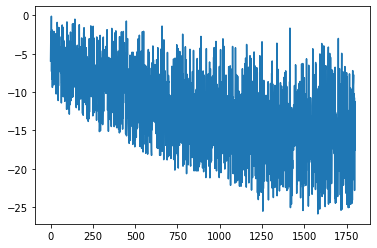

In [13]:
import matplotlib.pyplot as plt
plt.plot(log[200:])

# Net param

In [3]:
from __future__ import print_function
import io
import string
import numpy as np
import PIL
import base64
from glob import glob

import matplotlib.pylab as pl

import tensorflow as tf
from tensorflow.contrib import slim

from IPython.display import clear_output, Image, display, HTML

import moviepy.editor as mpy
from moviepy.video.io.ffmpeg_writer import FFMPEG_VideoWriter


# from google.colab import files

from lucid.modelzoo import vision_models
from lucid.misc.io import show, save, load
from lucid.optvis import objectives
from lucid.optvis import render
from lucid.misc.tfutil import create_session

In [4]:
def composite_activation(x):
    x = tf.atan(x)
    # Coefficients computed by:
    #   def rms(x):
    #     return np.sqrt((x*x).mean())
    #   a = np.arctan(np.random.normal(0.0, 1.0, 10**6))
    #   print(rms(a), rms(a*a))
    return tf.concat([x/0.67, (x*x)/0.6], -1)


def composite_activation_unbiased(x):
    x = tf.atan(x)
    # Coefficients computed by:
    #   a = np.arctan(np.random.normal(0.0, 1.0, 10**6))
    #   aa = a*a
    #   print(a.std(), aa.mean(), aa.std())
    return tf.concat([x/0.67, (x*x-0.45)/0.396], -1)


def relu_normalized(x):
    x = tf.nn.relu(x)
    # Coefficients computed by:
    #   a = np.random.normal(0.0, 1.0, 10**6)
    #   a = np.maximum(a, 0.0)
    #   print(a.mean(), a.std())
    return (x-0.40)/0.58


def image_cppn(
    size,
    num_output_channels=3,
    num_hidden_channels=24,
    num_layers=8,
    activation_fn=composite_activation,
    normalize=False):
    r = 3.0**0.5  # std(coord_range) == 1.0
    coord_range = tf.linspace(-r, r, size)
    y, x = tf.meshgrid(coord_range, coord_range, indexing='ij')
    net = tf.expand_dims(tf.stack([x, y], -1), 0)  # add batch dimension

    with slim.arg_scope([slim.conv2d], kernel_size=1, activation_fn=None):
        for i in range(num_layers):
            in_n = int(net.shape[-1])
            net = slim.conv2d(
              net, num_hidden_channels,
              # this is untruncated version of tf.variance_scaling_initializer
              weights_initializer=tf.random_normal_initializer(0.0, np.sqrt(1.0/in_n)),
            )
            if normalize:
                net = slim.instance_norm(net)
            net = activation_fn(net)

        rgb = slim.conv2d(net, num_output_channels, activation_fn=tf.nn.sigmoid,
                          weights_initializer=tf.zeros_initializer())
    return rgb


# vis = render.render_vis(model, xor_objective, param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=range(10), verbose=False)
# show(vis)

In [5]:
def video_cppn(
    size, t_size=70, 
    num_output_channels=3,
    num_hidden_channels=24,
    num_layers=8,
    activation_fn=composite_activation,
    normalize=False):
    
    r = 3.0**0.5  # std(coord_range) == 1.0
    coord_range = tf.linspace(-r, r, size)
    t_coord_range = tf.linspace(-r, r, t_size)
    z, y, x = tf.meshgrid(t_coord_range, coord_range, coord_range, indexing='ij')
    net = tf.expand_dims(tf.stack([z, x, y], -1), 0)  # add batch dimension

    with slim.arg_scope([slim.conv3d], kernel_size=1, activation_fn=None):
        for i in range(num_layers):
            in_n = int(net.shape[-1])
            net = slim.conv3d(
              net, num_hidden_channels,
              # this is untruncated version of tf.variance_scaling_initializer
              weights_initializer=tf.random_normal_initializer(0.0, np.sqrt(1.0/in_n)),
            )
            if normalize:
                net = slim.instance_norm(net)
            net = activation_fn(net)

        rgb = slim.conv3d(net, num_output_channels, activation_fn=tf.nn.sigmoid,
                          weights_initializer=tf.zeros_initializer())
    return rgb

## Test the network

In [5]:
cppn_f = lambda: video_cppn(128)
optimizer = tf.train.AdamOptimizer(0.01)

def xor_objective(T):
    a = T('input')[0]
    x = (tf.square(a[:, 0, 0])      + tf.square(a[:, -1, -1]) + 
           tf.square(1.0-a[:,-1, 0]) + tf.square(1.0-a[:, 0, -1]))
    # return -x
    return -tf.reduce_sum(x)


vis = L.render_vis(model, xor_objective, param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=range(40), verbose=False)

Instructions for updating:
Colocations handled automatically by placer.


In [ ]:
C.show(vis[-1])

## Visualize 

In [ ]:
cppn_f = lambda: video_cppn(128, 100)
optimizer = tf.train.AdamOptimizer(0.01)

vis = L.render_vis_explore(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=[100,120, 150, 180, 200, 300, 400, 500], verbose=True)

## Lets explore how the vsualization depends on the size

In [ ]:
cppn_f = lambda: video_cppn(224, 70)
optimizer = tf.train.AdamOptimizer(0.01)

vis = L.render_vis(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
# cppn_f = lambda: video_cppn(224, 70)
cppn_f = lambda: video_cppn(224, 20)
# cppn_f = lambda: video_cppn(128, 100)
optimizer = tf.train.AdamOptimizer(0.01)

vis = L.render_vis(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 20)
optimizer = tf.train.AdamOptimizer(0.01)

vis = L.render_vis(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 20)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 20)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[2], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 120)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[4], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 120)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[4], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 100)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[4], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

In [ ]:
cppn_f = lambda: video_cppn(128, 120)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[3], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

## A very long video

In [ ]:
cppn_f = lambda: video_cppn(64, 400)
optimizer = tf.train.AdamOptimizer(0.001)

vis = L.render_vis(model, L.inspected_str_objs[3], param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=list(range(0, 800, 100)), verbose=True)

## Draw a lot of visializations

In [ ]:
layers = L.inspected_layers + L.random_layers(40)
layers

cppn_xy, cppn_t = 128, 50
cppn_f = lambda: video_cppn(cppn_xy, cppn_t)
optimizer = tf.train.AdamOptimizer(0.001)

for layer, channel in L.tqdm(layers):
    vis = L.render_vis(model, f"{layer}:{channel}", param_f=cppn_f, optimizer=optimizer, transforms=[], thresholds=[100, 250, 500], verbose=True)
    C.showarray_saved(vis[-1], name="cppn", layer=layer, channel=channel, cppn_xy=cppn_xy, cppn_t=cppn_t)

# Visualize the logits 

In [5]:
from lucid.optvis.param import spatial, color, lowres


# layer = 'inceptioni3d/Logits/SpatialSqueeze'
layer = 'inceptioni3d/Logits/Conv3d_0c_1x1/conv_3d/add'
# obj = L.neuron(layer, 120)

# obj = L.channel('inceptioni3d/Mixed_5b/concat', 120)
# obj = "inceptioni3d/Mixed_5b/concat:120"

def obj(T):
    l = T(layer)
    print(l)
    
    l = tf.Print(l, [tf.shape(T('inceptioni3d/Mixed_5c/concat'))], 's3', summarize=10)
    l = tf.Print(l, [tf.shape(T('inceptioni3d/Conv3d_1a_7x7/Relu'))], 's4', summarize=10)
    l = tf.Print(l, [tf.shape(T('input'))], 'input ', summarize=10)
    l = tf.Print(l, [tf.shape(l)], 'output', summarize=10)
    l = tf.Print(l, [tf.shape(T('inceptioni3d/Conv3d_1a_7x7/conv_3d/convolution'))], 'first layer output', summarize=10)
    l = tf.Print(l, [], '-------------------', summarize=10)
    
    
    return l[0, 0, 0, 0, 0]


thresholds=list(range(10, 1000, 100))

param = lambda: L.video(79, 224, decorrelate=True, fft=True)

images = L.render_vis(model, obj, thresholds=thresholds,
                        param_f=param,                               
                        transforms=[]
                          # transforms=L.standard_transforms
                     )


# C.save_vid(images[-1], name='logints', frames='-'.join(map(str, fs)))

Tensor("import/inceptioni3d/Logits/Conv3d_0c_1x1/conv_3d/add:0", shape=(1, ?, ?, ?, 400), dtype=float32)


HERE


t:  39%|███▉      | 31/79 [00:00<00:00, 307.09it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


10 82.21198


t:  27%|██▋       | 21/79 [00:00<00:00, 200.81it/s, now=None]

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
